<a href="https://colab.research.google.com/github/shamreen20/computer-vision/blob/master/Blurring_and_smoothing_by_myself.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Here we apply diverse linear filters to smooth images using OpenCV functions such as:**
* blur
* GaussianBlur
* medianBlur
* bilateralFilter 

**Smoothing, also called blurring, is a simple and frequently used image processing operation.**

There are many reasons for smoothing. Here we will focus on smoothing in order to reduce noise.

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Convenience function

In [ ]:
def load_img():
    img = cv.imread('C:\\Users\\Rafiun Nesha\\Desktop\\images\\download3.jpg').astype(np.float32)/255
    img = cv.cvtColor(img,cv.COLOR_BGR2RGB)
    return img

In [ ]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

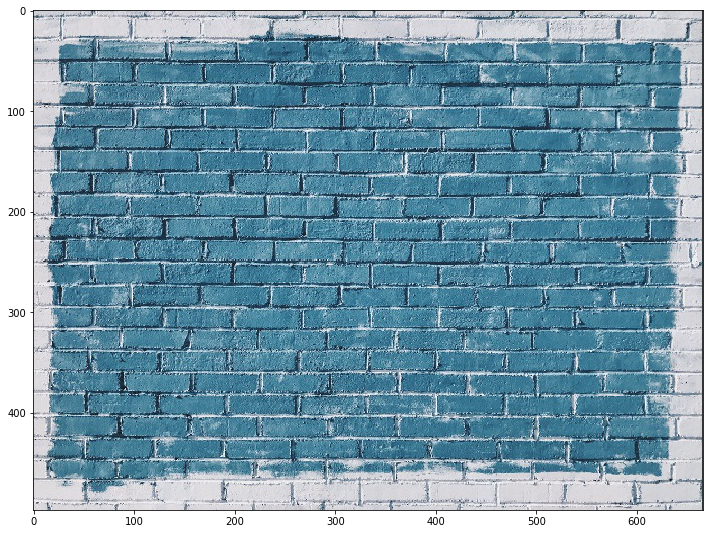

In [ ]:
i = load_img()
display_img(i)

# Gamma Correction : Practical Effect of Increasing Brightness

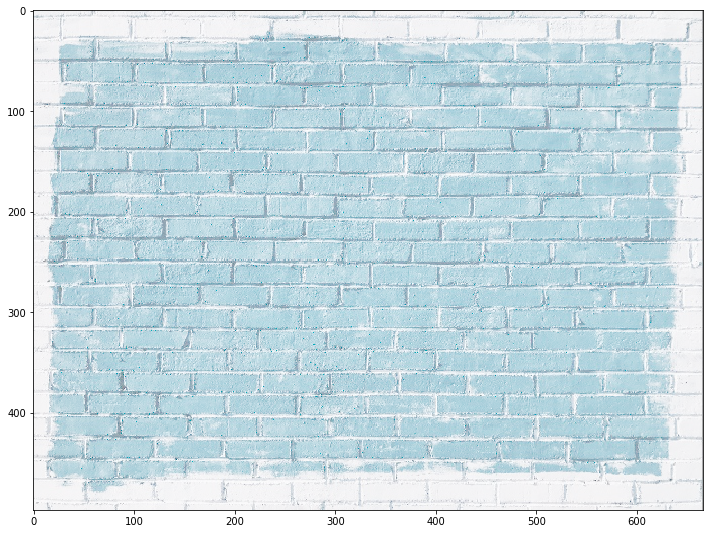

In [ ]:
img = load_img()
gamma = 1/4
effected_image = np.power(img, gamma)
display_img(effected_image)

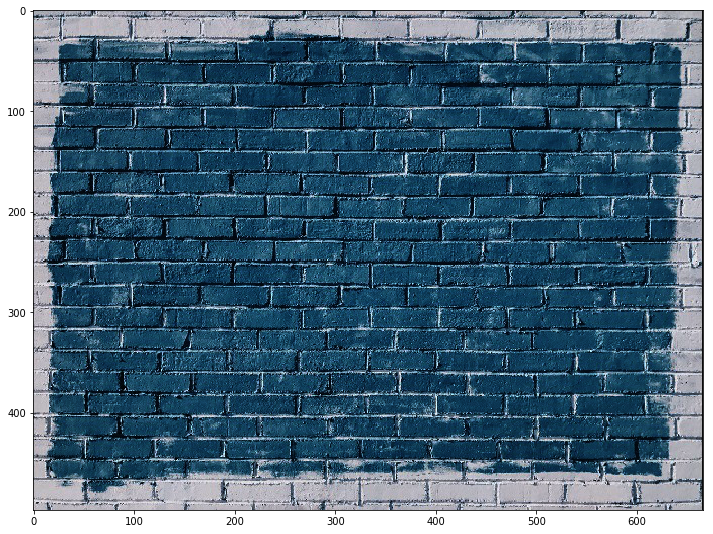

In [ ]:
img = load_img()
gamma = 2
effected_image = np.power(img, gamma)
display_img(effected_image)

# low pass Filter with a 2D Convolutional

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


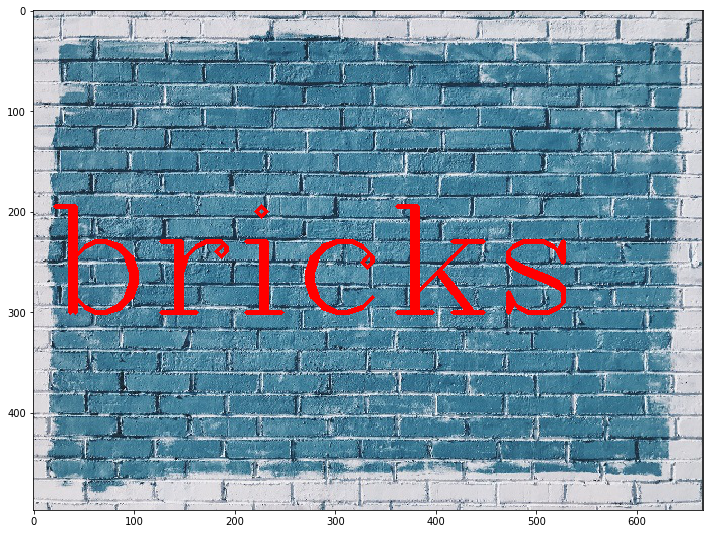

In [ ]:
img = load_img()
font = cv.FONT_HERSHEY_COMPLEX
cv.putText(img,text="bricks",org=(12,300), fontFace=font, fontScale=5, color=(255,0,0), thickness=4)
display_img(img)

# create the Kernel

In [ ]:
kernel = np.ones(shape=(5,5), dtype=np.float32)/25

In [ ]:
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


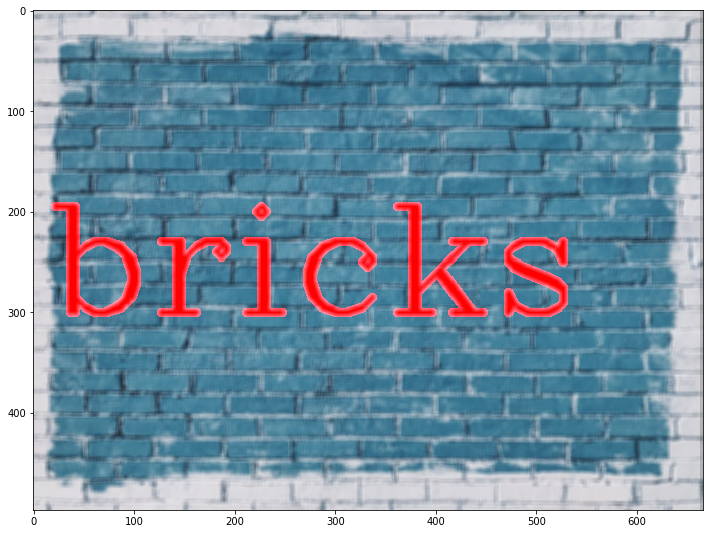

In [ ]:
dst = cv.filter2D(img,-1,kernel)
display_img(dst)

# Averaging

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


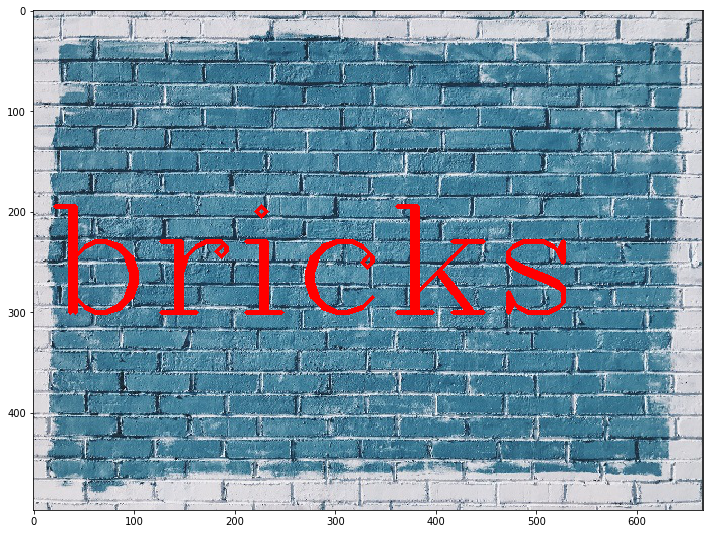

In [ ]:
img = load_img()
font = cv.FONT_HERSHEY_COMPLEX
cv.putText(img,text="bricks",org=(12,300), fontFace = font, fontScale=5, color=(255,0,0), thickness=4)
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


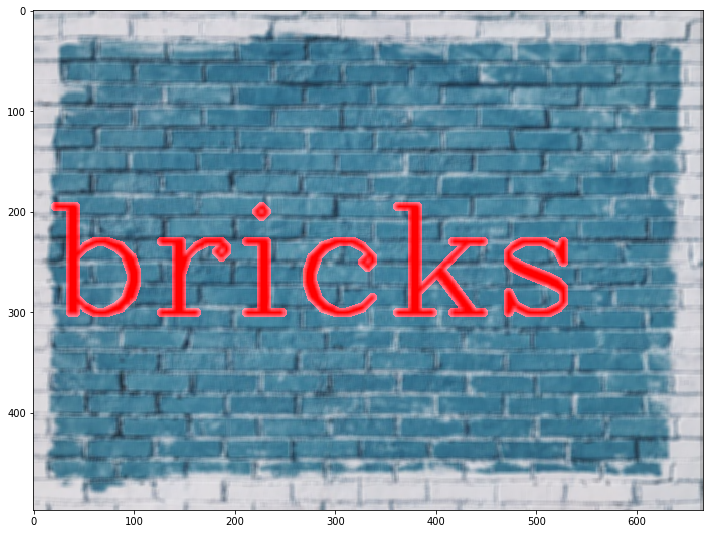

In [ ]:
blurred_img = cv.blur(img, ksize=(5,5))
display_img(blurred_img)

# Gaussian Blurring
**Probably the most useful filter (although not the fastest). Gaussian filtering is done by convolving each point in the input array with a Gaussian kernel and then summing them all to produce the output array.**



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


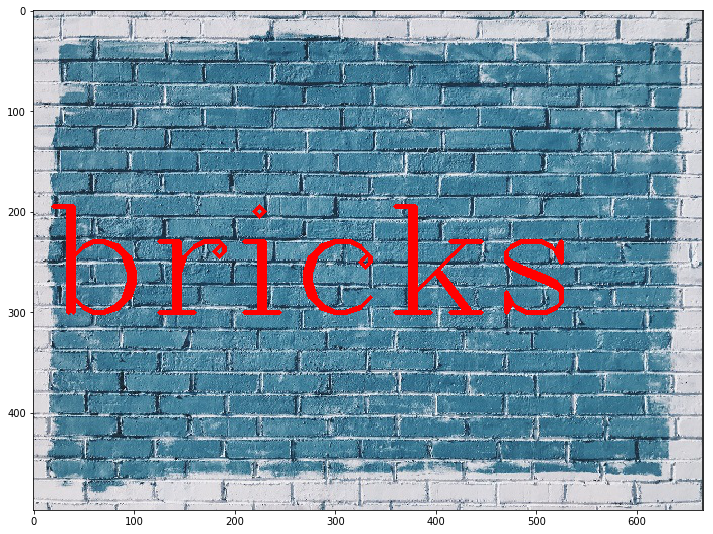

In [ ]:
img = load_img()
font = cv.FONT_HERSHEY_COMPLEX
cv.putText(img, text="bricks", org=(10,300), fontFace=font, fontScale=5, color=(255,0,0), thickness=4)
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


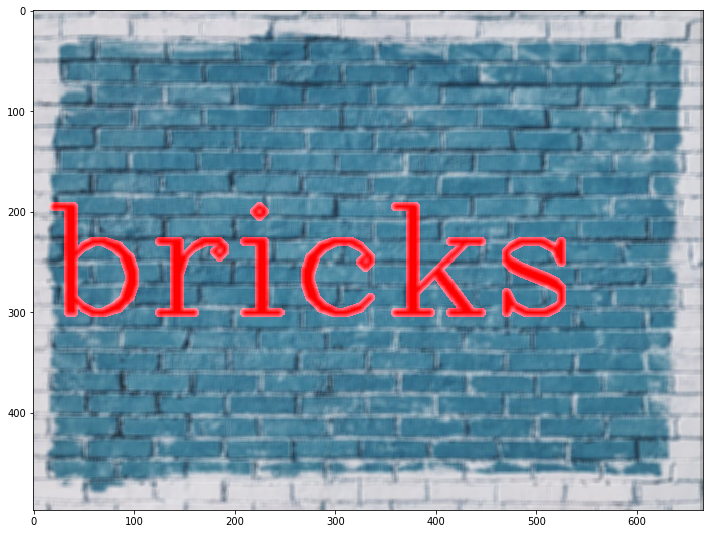

In [ ]:
blurred_img = cv.GaussianBlur(img,(5,5),10)
display_img(blurred_img)

# Median Blur
**The median filter run through each element of the signal (in this case the image) and replace each pixel with the median of its neighboring pixels (located in a square neighborhood around the evaluated pixel).**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


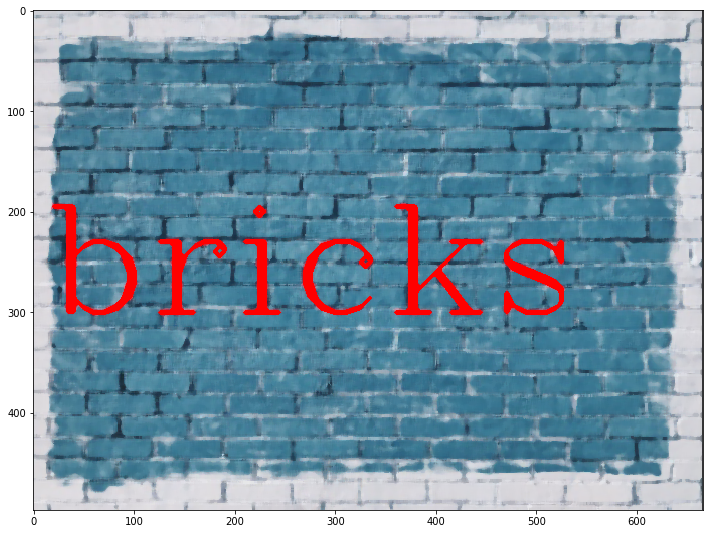

In [ ]:
blurred_img = cv.medianBlur(img,5)
display_img(blurred_img)

# Adding Noise
Let's see a more useful case of Median Blurring by adding some random noise to an image.

In [ ]:
img = cv.imread("C:\\Users\\Rafiun Nesha\\Desktop\\images\\Trump.jpg")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

In [ ]:
img.max()

255

In [ ]:
img.min()

0

In [ ]:
img.mean()

90.73163763650464

In [ ]:
img.shape

(465, 342, 3)

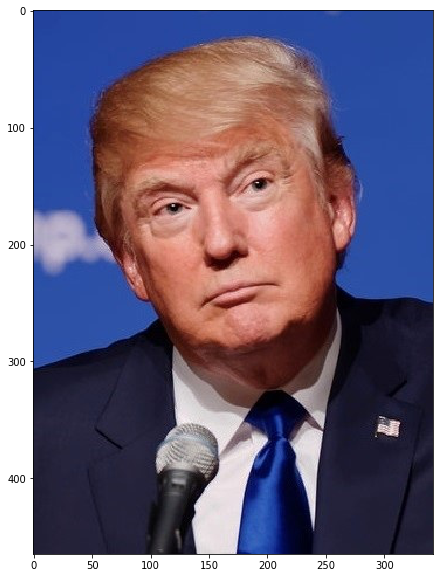

In [ ]:
display_img(img)

In [ ]:
white_noise = np.random.randint(low=0, high=2, size=(465,342,3))

In [ ]:
white_noise = white_noise*255

In [ ]:
white_noise.shape

(465, 342, 3)

In [ ]:
img.shape

(465, 342, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


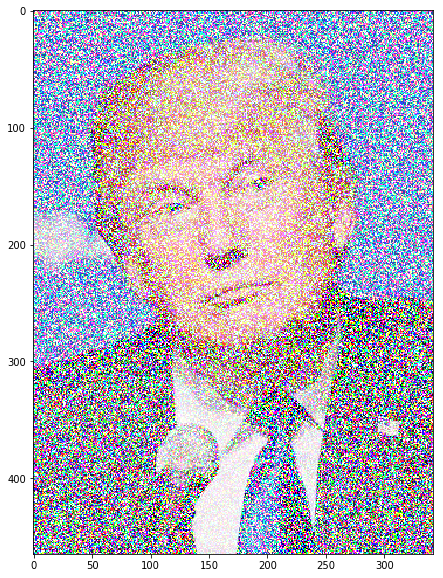

In [ ]:
noise_img = white_noise+ img
display_img(noise_img)

In [ ]:
 from skimage.util import random_noise

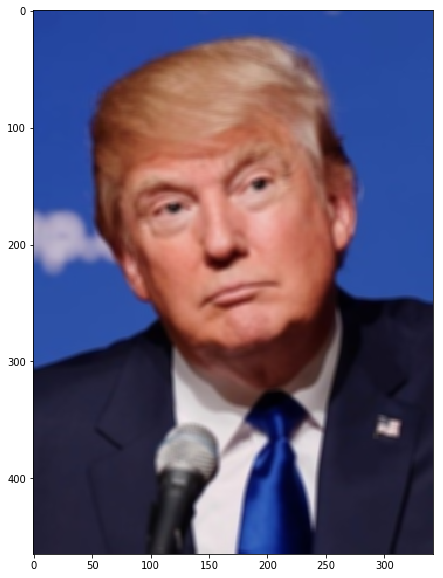

In [ ]:
median = cv.GaussianBlur(img,(5,5),10)
display_img(median)

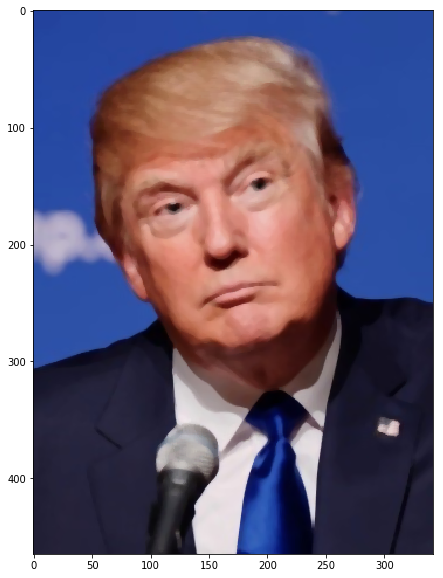

In [ ]:
median = cv.medianBlur(img,5)
display_img(median)

# Bilateral filter
* **So far, we have explained some filters which main goal is to smooth an input image. However, sometimes the filters do not only dissolve the noise, but also smooth away the edges. To avoid this (at certain extent at least), we can use a bilateral filter.**

* **In an analogous way as the Gaussian filter, the bilateral filter also considers the neighboring pixels with weights assigned to each of them. These weights have two components, the first of which is the same weighting used by the Gaussian filter. The second component takes into account the difference in intensity between the neighboring pixels and the evaluated one.**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


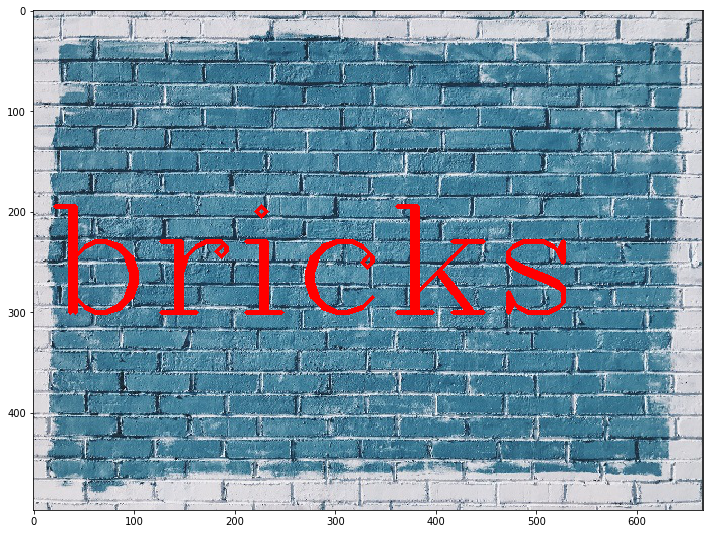

In [ ]:
image = load_img()
font = cv.FONT_HERSHEY_COMPLEX
cv.putText(image, text="bricks", org=(12,300),fontFace=font, fontScale=5, color=(255,0,0), thickness=4)
display_img(image)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


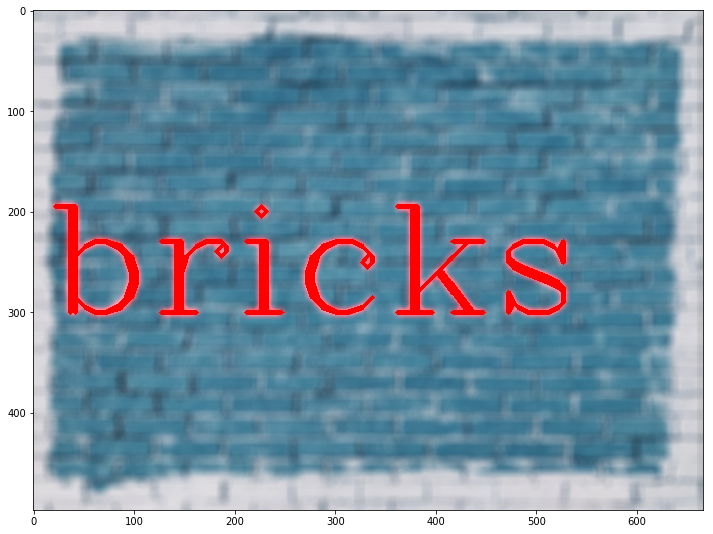

In [ ]:
blur = cv.bilateralFilter(image,12,75,75)
display_img(blur)